<a href="https://colab.research.google.com/github/akshaya-ravikumar19/Custom-Trained-Yolo-Model/blob/main/Custom_Yolo_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Custom-Training yolo model for 10 Images**

In [ ]:
pip install ultralytics opencv-python matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.1 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model = YOLO("yolov8n.pt")

In [ ]:
import zipfile
import os

zip_path = "/content/Vehicle Detection.v2i.yolov8.zip"
extract_path = "/content/road_traffic_dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted!")

Dataset extracted!


In [ ]:
model.train(
    data="/content/road_traffic_dataset/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16
)

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/road_traffic_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=T

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b2c7652caa0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [ ]:
model = YOLO("/content/runs/detect/train/weights/last.pt")

In [ ]:
test_image = "/content/road_traffic_dataset/train/images/download-1-_jpeg.rf.4f3b68653d674ec0f3211dd308d4f198.jpg"

In [ ]:
results = model(test_image, conf=0.25)


image 1/1 /content/road_traffic_dataset/train/images/download-1-_jpeg.rf.4f3b68653d674ec0f3211dd308d4f198.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 1 Car, 2 Two-Wheelers, 53.8ms
Speed: 10.3ms preprocess, 53.8ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
class_names = model.names

for r in results:
    for box in r.boxes:
        class_id = int(box.cls[0])
        confidence = float(box.conf[0])
        print(f"Detected {class_names[class_id]} with confidence {confidence:.2f}")

Detected Two-Wheeler with confidence 0.85
Detected Auto-Rickshaw with confidence 0.73
Detected Two-Wheeler with confidence 0.59
Detected Car with confidence 0.49
Detected Bus with confidence 0.32


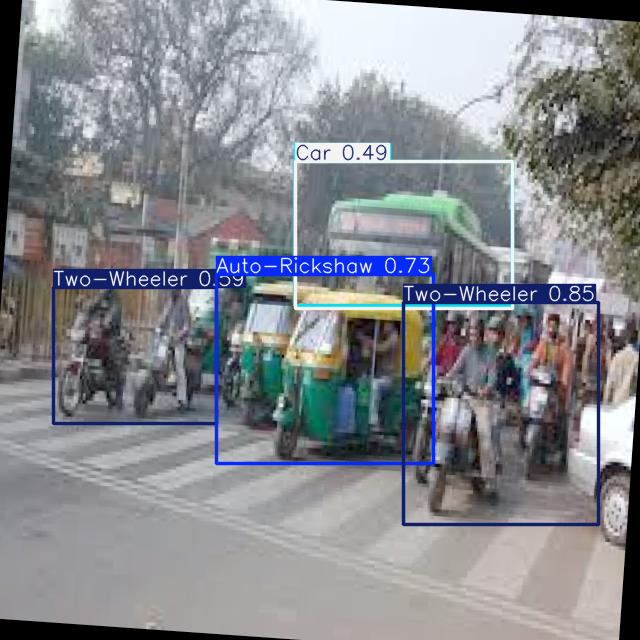

In [ ]:
results[0].show()

In [ ]:
results[0].save(filename="/content/output.jpg")

'/content/output.jpg'

In [ ]:
model(
    "/content/road_traffic_dataset/train/images",
    conf=0.3,
    save=True
)


image 1/24 /content/road_traffic_dataset/train/images/download-1-_jpeg.rf.4f3b68653d674ec0f3211dd308d4f198.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 1 Car, 2 Two-Wheelers, 9.2ms
image 2/24 /content/road_traffic_dataset/train/images/download-1-_jpeg.rf.b125248f42d992abea45c7e291a4f751.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 1 Car, 2 Two-Wheelers, 7.3ms
image 3/24 /content/road_traffic_dataset/train/images/download-1-_jpeg.rf.befbb0b712be56da9ff286e459b1e55e.jpg: 640x640 1 Auto-Rickshaw, 2 Two-Wheelers, 7.3ms
image 4/24 /content/road_traffic_dataset/train/images/download-2-_jpeg.rf.01a00e24ade4cbcc757a7a535dee5dc1.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 6 Cars, 1 Truck, 2 Two-Wheelers, 7.3ms
image 5/24 /content/road_traffic_dataset/train/images/download-2-_jpeg.rf.2eca1744f0125205764c68e33162a714.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 7 Cars, 1 Truck, 2 Two-Wheelers, 7.3ms
image 6/24 /content/road_traffic_dataset/train/images/download-2-_jpeg.rf.d23757862820b3acef39509b10863509.jpg: 640x640 1 Auto-R

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Auto-Rickshaw', 1: 'Bus', 2: 'Car', 3: 'Truck', 4: 'Two-Wheeler'}
 obb: None
 orig_img: array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],


Contents of /content/road_traffic_dataset:
['train', 'valid', 'data.yaml', 'README.roboflow.txt']
Contents of /content/road_traffic_dataset/test:
Error: Test directory not found at /content/road_traffic_dataset/test

image 1/1 /content/road_traffic_dataset/valid/images/download_jpeg.rf.bf8046aa85a0a348307cdae303ecd8b7.jpg: 640x640 1 Car, 7.4ms
Speed: 2.1ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


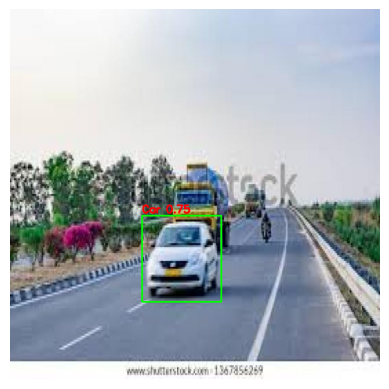

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Base path to the extracted dataset
base_dataset_path = "/content/road_traffic_dataset"

# --- Diagnostic Code Start ---
print(f"Contents of {base_dataset_path}:")
if os.path.exists(base_dataset_path):
    print(os.listdir(base_dataset_path))
    test_path = os.path.join(base_dataset_path, "test") # This path doesn't exist as seen in output
    print(f"Contents of {test_path}:")
    if os.path.exists(test_path):
        print(os.listdir(test_path))
    else:
        print(f"Error: Test directory not found at {test_path}")
else:
    print(f"Error: Base dataset directory not found at {base_dataset_path}")
# --- Diagnostic Code End ---

# Corrected path to the validation images directory, since 'test' does not exist
image_dir = os.path.join(base_dataset_path, "valid", "images") # Using 'valid' set

# Get the first image file in the directory
if not os.path.exists(image_dir):
    print(f"Error: {image_dir} does not exist. Please check the directory structure.")
    raise FileNotFoundError(f"No such directory: {image_dir}")

img_files = os.listdir(image_dir)

if not img_files:
    print("Error: No image files found in the directory.")
else:
    img_name = img_files[0] # Take the first image
    img_path = os.path.join(image_dir, img_name)

    img = cv2.imread(img_path)

    # Check if image was loaded successfully before processing
    if img is None:
        print(f"Error: Failed to load image from {img_path}. Please check the path and file integrity.")
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        results = model(img_path, conf=0.25)
        class_names = model.names

        for r in results:
            for box in r.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                cls = int(box.cls[0])
                conf = float(box.conf[0])

                label = f"{class_names[cls]} {conf:.2f}"

                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(
                    img,
                    label,
                    (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255, 0, 0),
                    2
                )

        plt.imshow(img)
        plt.axis("off")


image 1/1 /content/road_traffic_dataset/train/images/download-3-_jpeg.rf.e61c2afe9fe064487ac3eb2fa57f060d.jpg: 640x640 1 Truck, 15.8ms
Speed: 4.1ms preprocess, 15.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


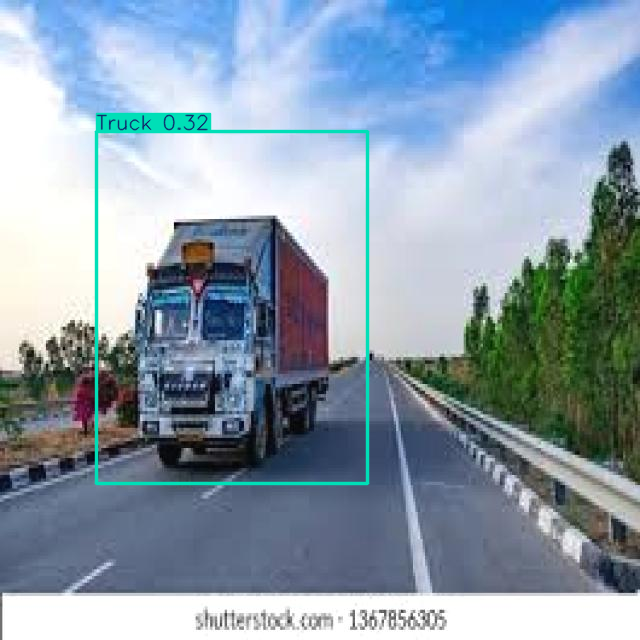


image 1/1 /content/road_traffic_dataset/train/images/download-1-_jpeg.rf.4f3b68653d674ec0f3211dd308d4f198.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 1 Car, 2 Two-Wheelers, 8.6ms
Speed: 2.1ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


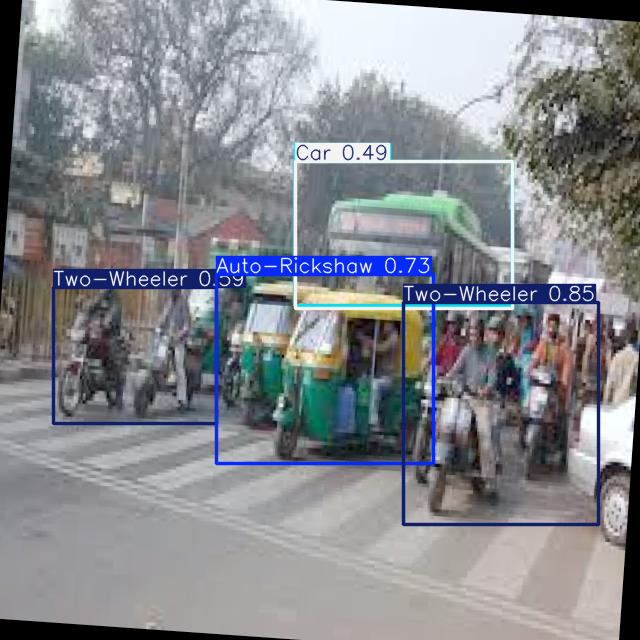


image 1/1 /content/road_traffic_dataset/train/images/images-1-_jpeg.rf.d50cade8d131ad43f48d88faefaedddd.jpg: 640x640 1 Car, 2 Trucks, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


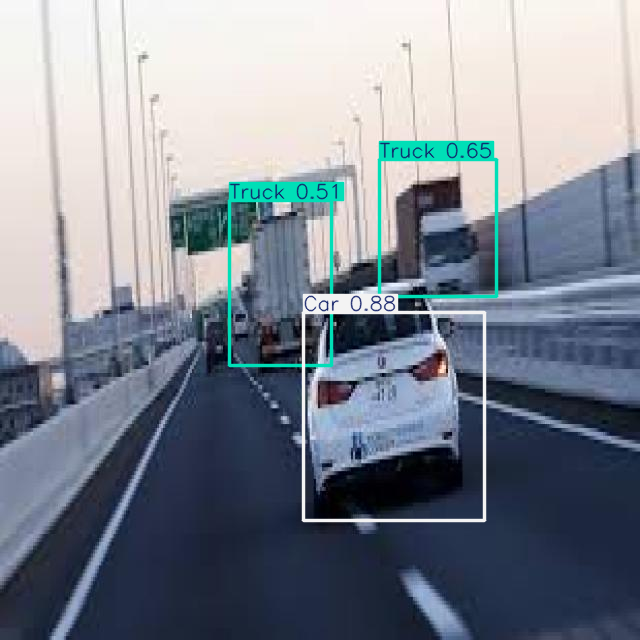


image 1/1 /content/road_traffic_dataset/train/images/images-2-_jpeg.rf.4ca8482f7603c0b2a81daac3da12d6b9.jpg: 640x640 1 Truck, 3 Two-Wheelers, 10.0ms
Speed: 3.5ms preprocess, 10.0ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


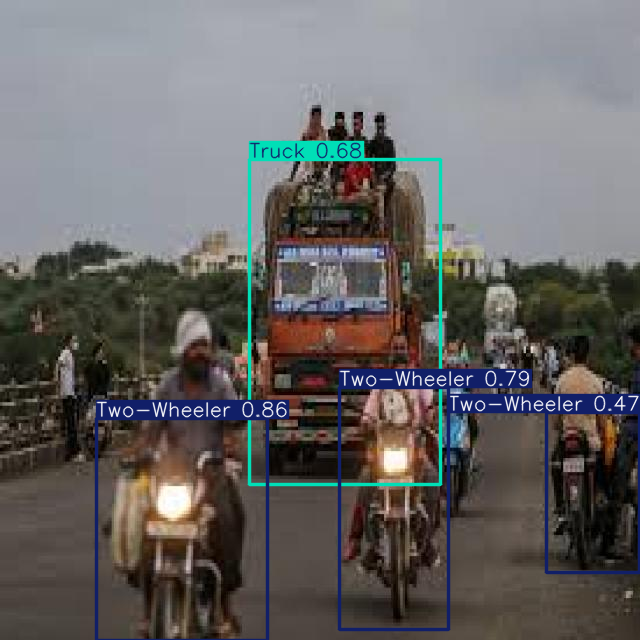


image 1/1 /content/road_traffic_dataset/train/images/images-3-_jpeg.rf.a206371da4d55b751b28565ec0694cec.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 5 Cars, 4 Two-Wheelers, 8.2ms
Speed: 2.0ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


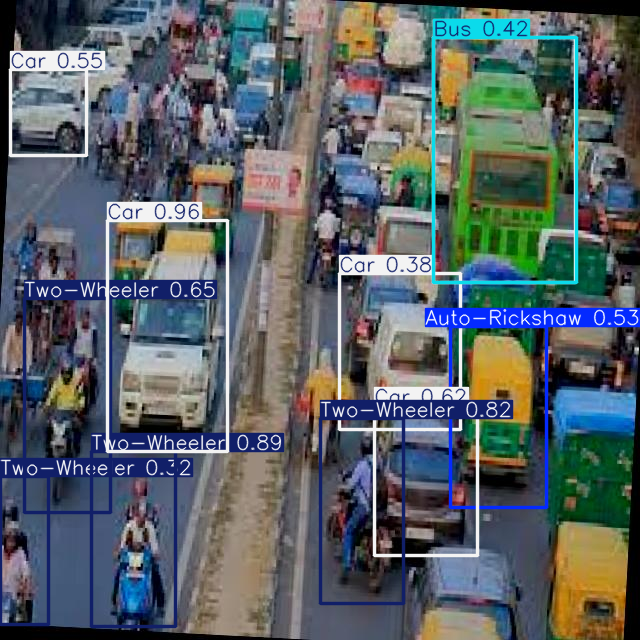


image 1/1 /content/road_traffic_dataset/train/images/download-3-_jpeg.rf.b4b5e8fc7c78a192a53d3725a784f047.jpg: 640x640 1 Truck, 9.6ms
Speed: 2.1ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


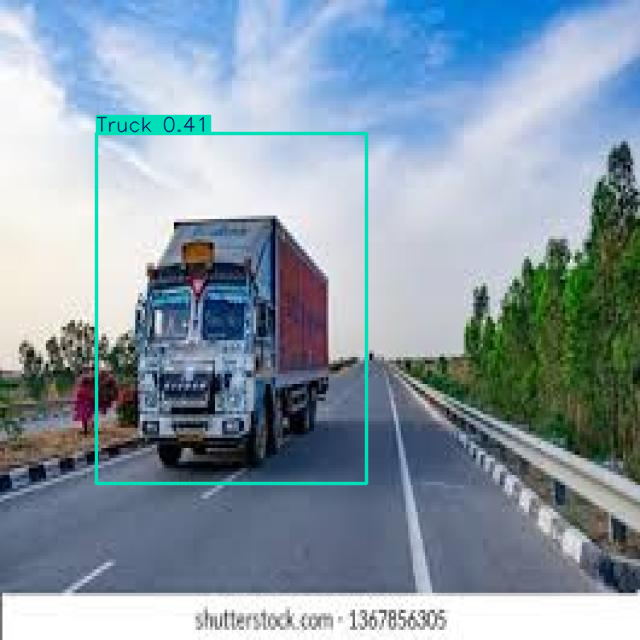


image 1/1 /content/road_traffic_dataset/train/images/download-5-_jpeg.rf.f7e4d73452ac26443960ae7ac99fb9e4.jpg: 640x640 3 Cars, 3 Trucks, 8.3ms
Speed: 6.1ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


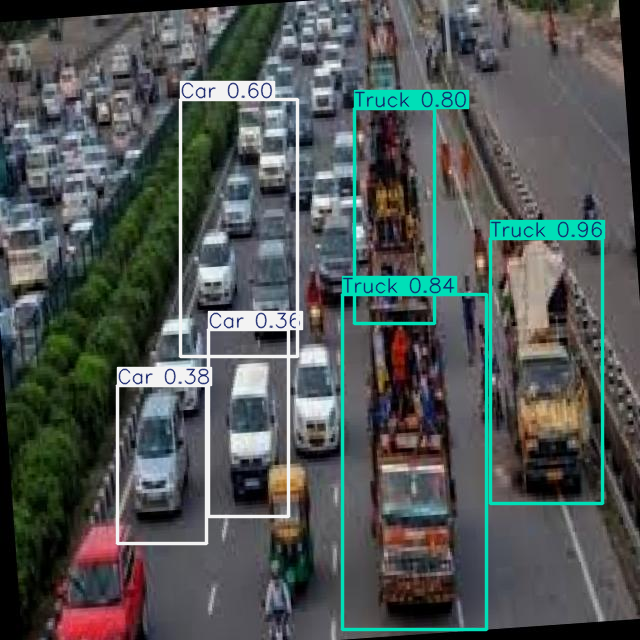


image 1/1 /content/road_traffic_dataset/train/images/images-3-_jpeg.rf.669a88e4d995a4b5ec2078cdf71b0aad.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 5 Cars, 4 Two-Wheelers, 12.2ms
Speed: 4.2ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


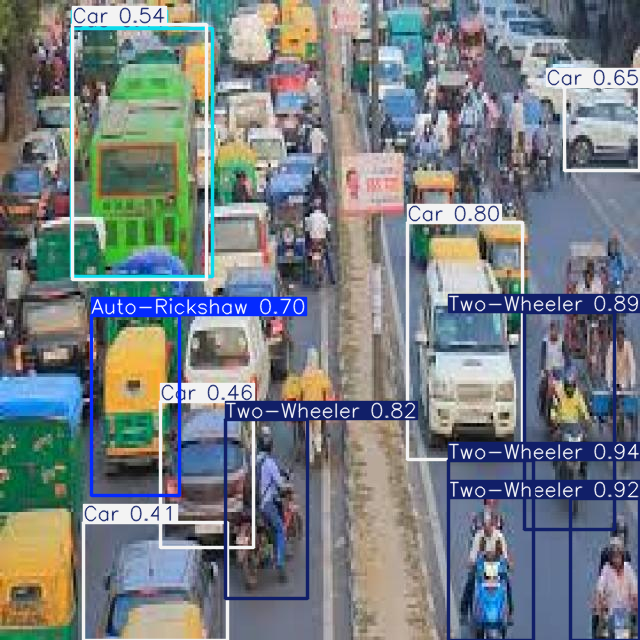


image 1/1 /content/road_traffic_dataset/train/images/images-1-_jpeg.rf.77414904cb9bc6b3caabb0fdabd7f50a.jpg: 640x640 1 Car, 1 Truck, 12.7ms
Speed: 3.3ms preprocess, 12.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


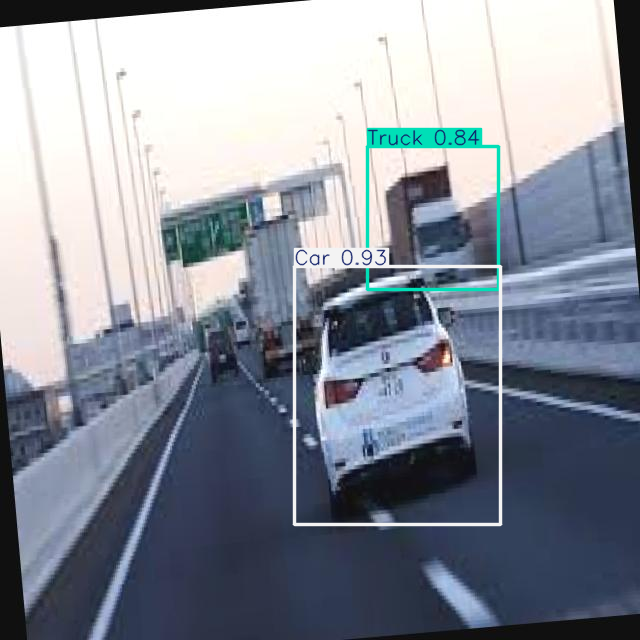


image 1/1 /content/road_traffic_dataset/train/images/images-2-_jpeg.rf.e9725d5d9722f6c2139df82573b4d216.jpg: 640x640 1 Truck, 2 Two-Wheelers, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


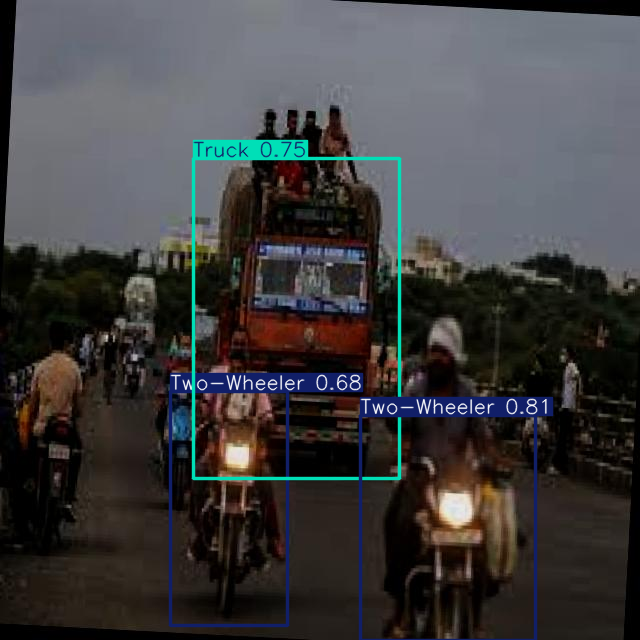


image 1/1 /content/road_traffic_dataset/train/images/images-1-_jpeg.rf.2fdbd937e49238d0088eecfe4530736a.jpg: 640x640 1 Car, 2 Trucks, 11.0ms
Speed: 2.2ms preprocess, 11.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


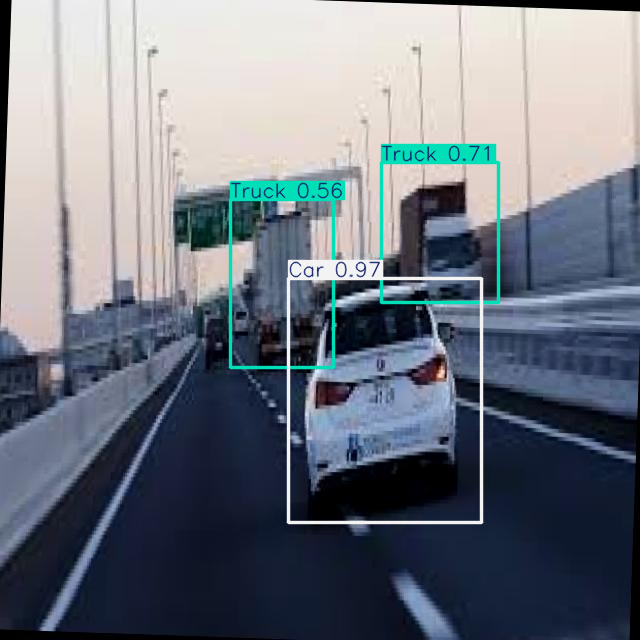


image 1/1 /content/road_traffic_dataset/train/images/download-1-_jpeg.rf.b125248f42d992abea45c7e291a4f751.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 1 Car, 2 Two-Wheelers, 14.1ms
Speed: 2.9ms preprocess, 14.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


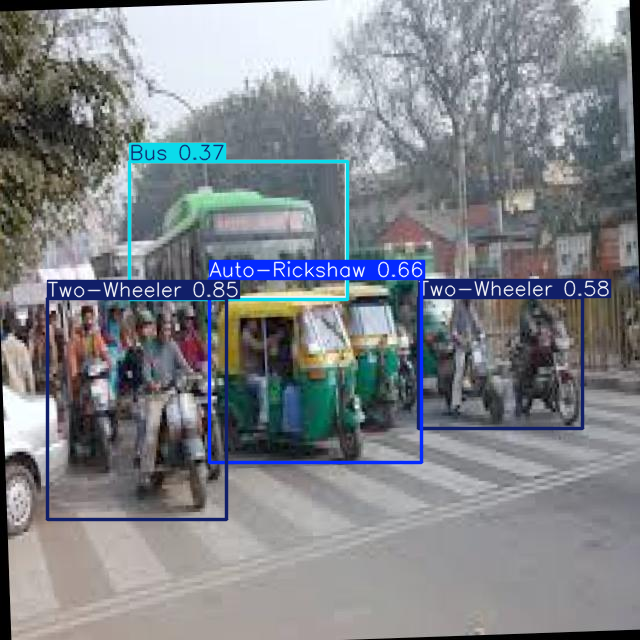


image 1/1 /content/road_traffic_dataset/train/images/images_jpeg.rf.dcf149dba37e95563c0a4a30c1a70b2f.jpg: 640x640 2 Auto-Rickshaws, 1 Car, 1 Truck, 1 Two-Wheeler, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


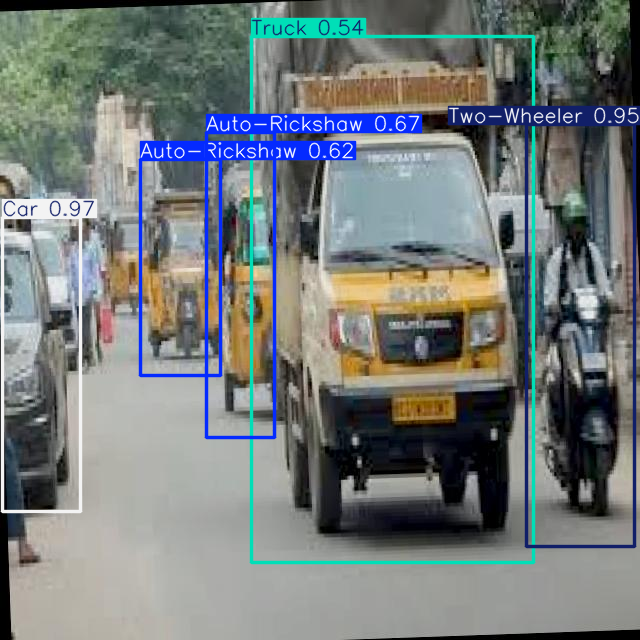


image 1/1 /content/road_traffic_dataset/train/images/images_jpeg.rf.21bebca4fab6c88a09c2dacc130a5033.jpg: 640x640 3 Auto-Rickshaws, 1 Car, 1 Truck, 1 Two-Wheeler, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


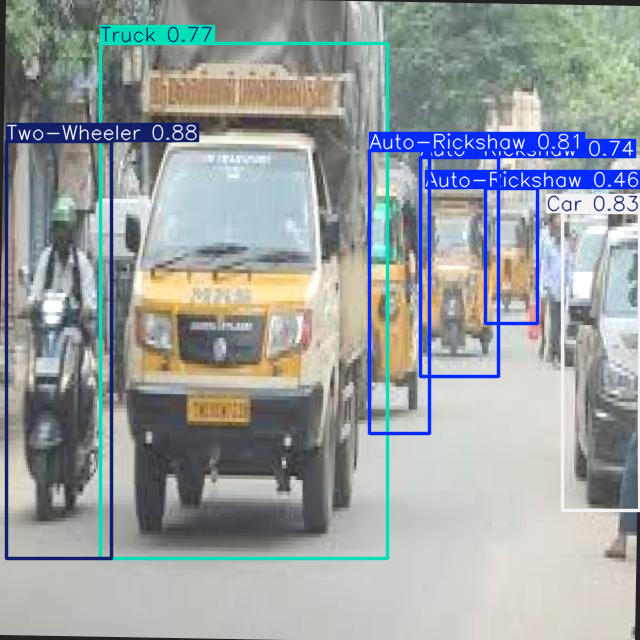


image 1/1 /content/road_traffic_dataset/train/images/download-5-_jpeg.rf.91fd6221fa40aa43d5526f19446e3d6f.jpg: 640x640 3 Cars, 3 Trucks, 14.7ms
Speed: 1.9ms preprocess, 14.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


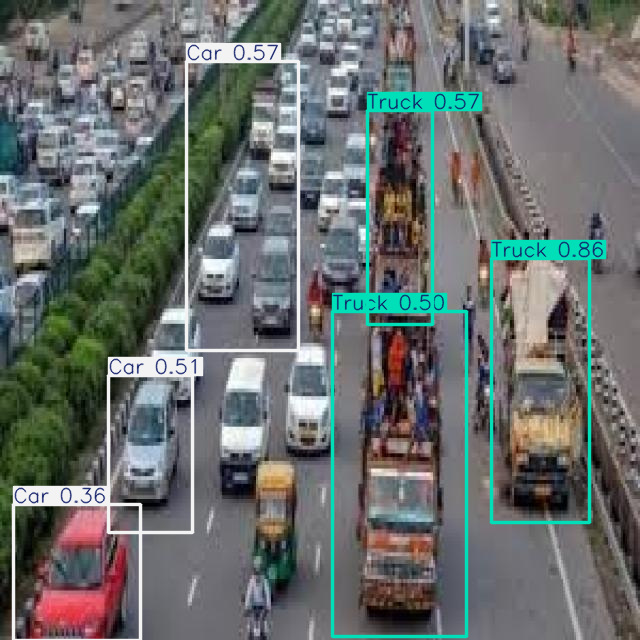


image 1/1 /content/road_traffic_dataset/train/images/images_jpeg.rf.d3aece33db38c0f94e269945d428a2ae.jpg: 640x640 3 Auto-Rickshaws, 1 Car, 1 Truck, 1 Two-Wheeler, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


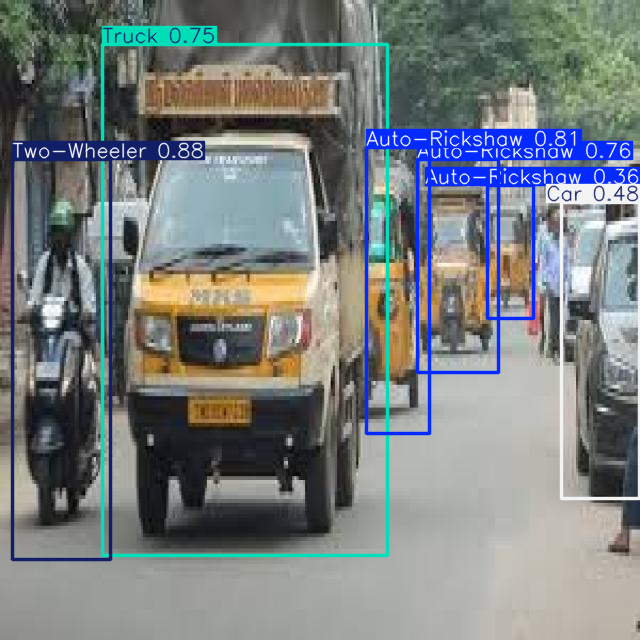


image 1/1 /content/road_traffic_dataset/train/images/download-2-_jpeg.rf.01a00e24ade4cbcc757a7a535dee5dc1.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 6 Cars, 1 Truck, 2 Two-Wheelers, 9.6ms
Speed: 2.1ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


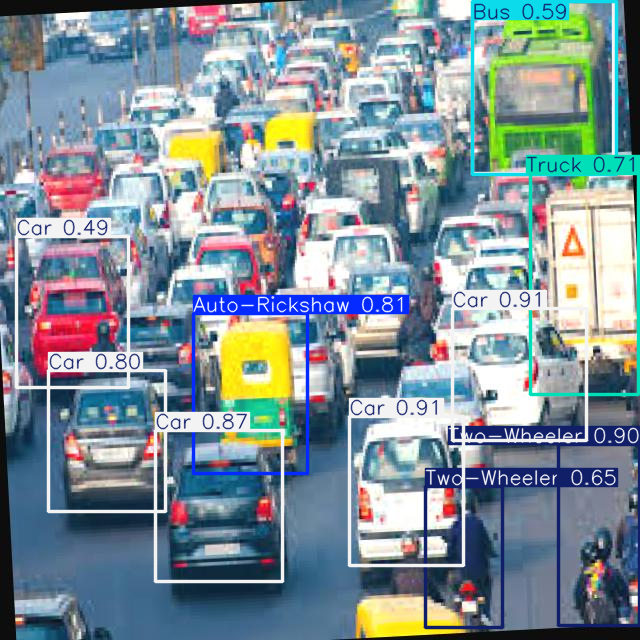


image 1/1 /content/road_traffic_dataset/train/images/download-2-_jpeg.rf.2eca1744f0125205764c68e33162a714.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 7 Cars, 1 Truck, 2 Two-Wheelers, 14.1ms
Speed: 2.1ms preprocess, 14.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


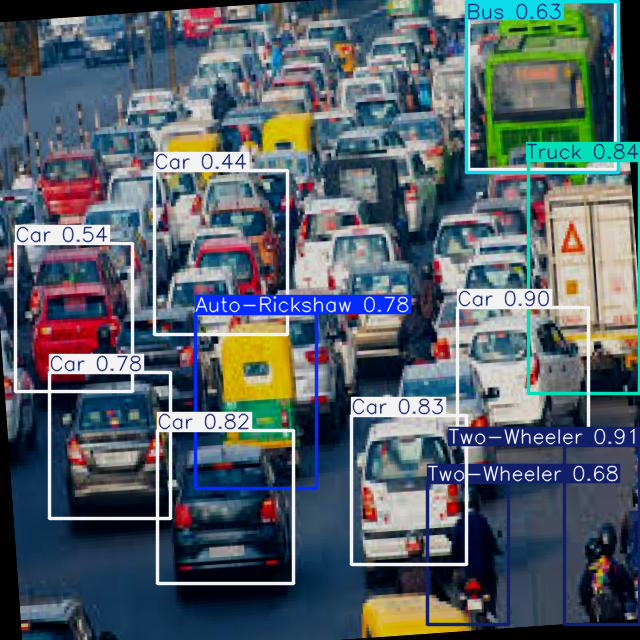


image 1/1 /content/road_traffic_dataset/train/images/download-1-_jpeg.rf.befbb0b712be56da9ff286e459b1e55e.jpg: 640x640 1 Auto-Rickshaw, 2 Two-Wheelers, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


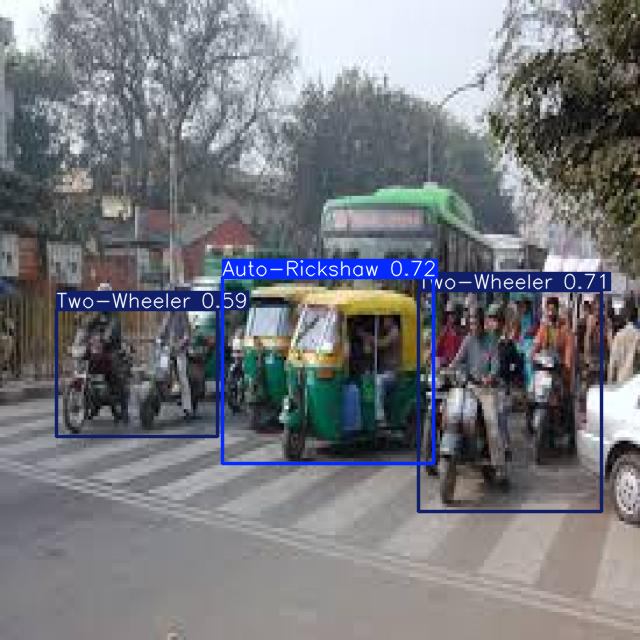


image 1/1 /content/road_traffic_dataset/train/images/download-5-_jpeg.rf.0bf5e4d847af6eae8c228ab5e3847f33.jpg: 640x640 1 Auto-Rickshaw, 1 Car, 3 Trucks, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


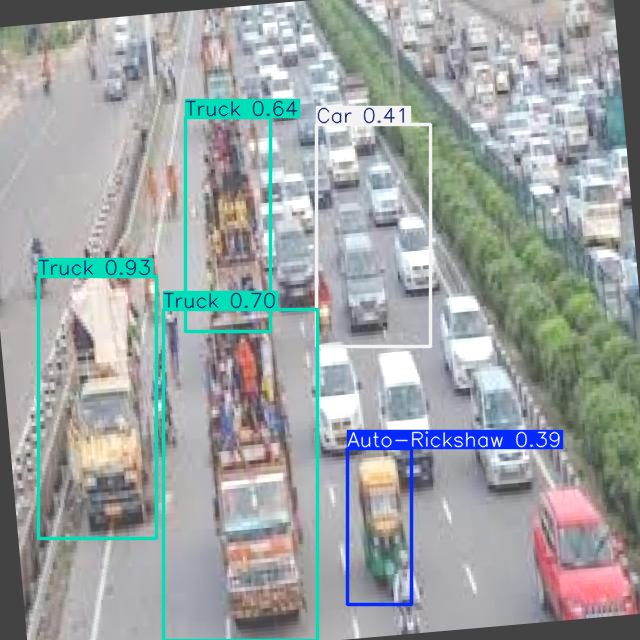


image 1/1 /content/road_traffic_dataset/train/images/download-2-_jpeg.rf.d23757862820b3acef39509b10863509.jpg: 640x640 1 Auto-Rickshaw, 1 Bus, 8 Cars, 1 Truck, 2 Two-Wheelers, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


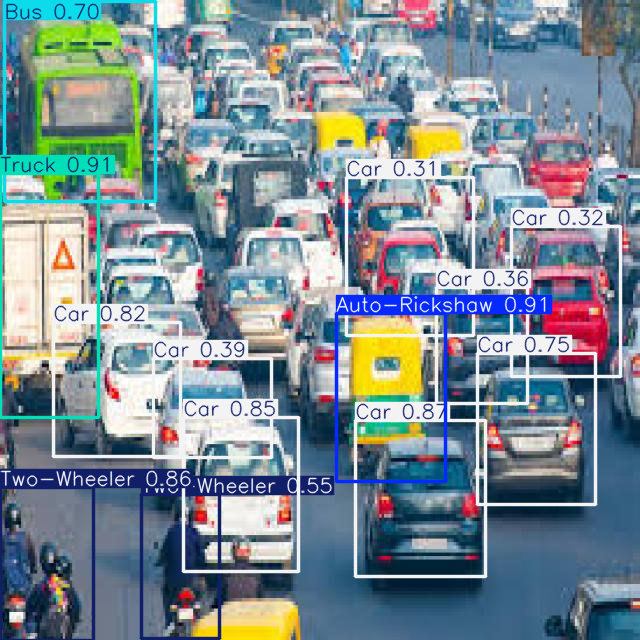


image 1/1 /content/road_traffic_dataset/train/images/images-3-_jpeg.rf.a076a034c353aff0cc8627e3dfac3115.jpg: 640x640 1 Auto-Rickshaw, 4 Cars, 4 Two-Wheelers, 10.7ms
Speed: 3.7ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


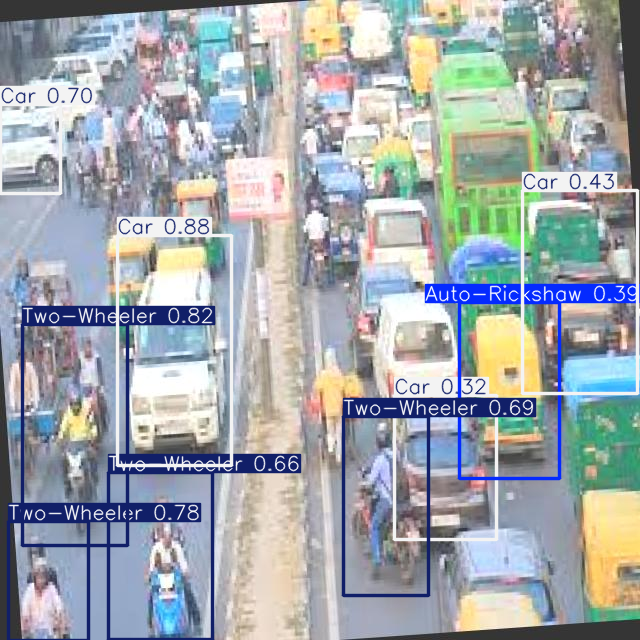


image 1/1 /content/road_traffic_dataset/train/images/download-3-_jpeg.rf.322b1e7d41370ca91b4978a6c7e1f6ce.jpg: 640x640 1 Truck, 11.7ms
Speed: 4.4ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


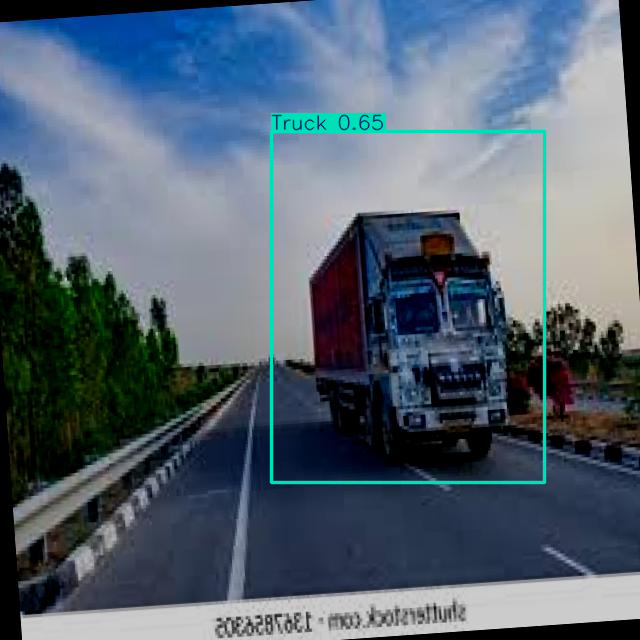


image 1/1 /content/road_traffic_dataset/train/images/images-2-_jpeg.rf.d849a2508cdce536f1eea990ee0debb6.jpg: 640x640 1 Truck, 3 Two-Wheelers, 10.4ms
Speed: 4.1ms preprocess, 10.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


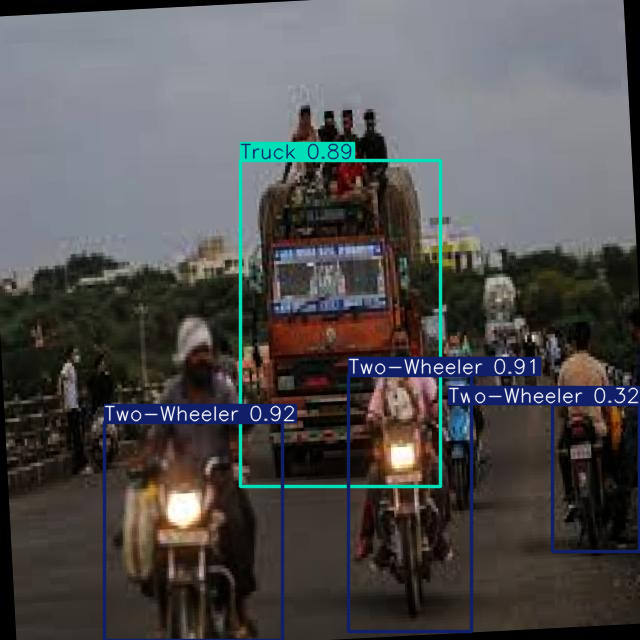

In [ ]:
import os

image_dir = "/content/road_traffic_dataset/train/images"

for img_name in os.listdir(image_dir):
    img_path = os.path.join(image_dir, img_name)
    results = model(img_path, conf=0.3)
    results[0].show()

# **Custom-Training yolo model for 100 Images**

In [ ]:
import zipfile
import os

zip_path = "/content/Vehicle Detection - Model.v2i.yolov8.zip"
extract_path = "/content/vehicle_detection_dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted!")

Dataset extracted!


In [ ]:
model.train(
    data="/content/vehicle_detection_dataset/data.yaml",
    epochs=100,
    imgsz=640,
    batch=16
)

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vehicle_detection_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, p

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a27e4adb080>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [ ]:
model = YOLO("/content/runs/detect/train/weights/last.pt")

In [ ]:
test_image = "/content/vehicle_detection_dataset/train/images/100_jpg.rf.5f15b0b5389a0e75ae4339cdc591d0f5.jpg"

In [ ]:
results = model(test_image, conf=0.25)


image 1/1 /content/vehicle_detection_dataset/train/images/100_jpg.rf.5f15b0b5389a0e75ae4339cdc591d0f5.jpg: 640x640 3 Trucks, 11.9ms
Speed: 4.5ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
class_names = model.names

for r in results:
    for box in r.boxes:
        class_id = int(box.cls[0])
        confidence = float(box.conf[0])
        print(f"Detected {class_names[class_id]} with confidence {confidence:.2f}")

Detected Truck with confidence 0.97
Detected Truck with confidence 0.97
Detected Truck with confidence 0.92


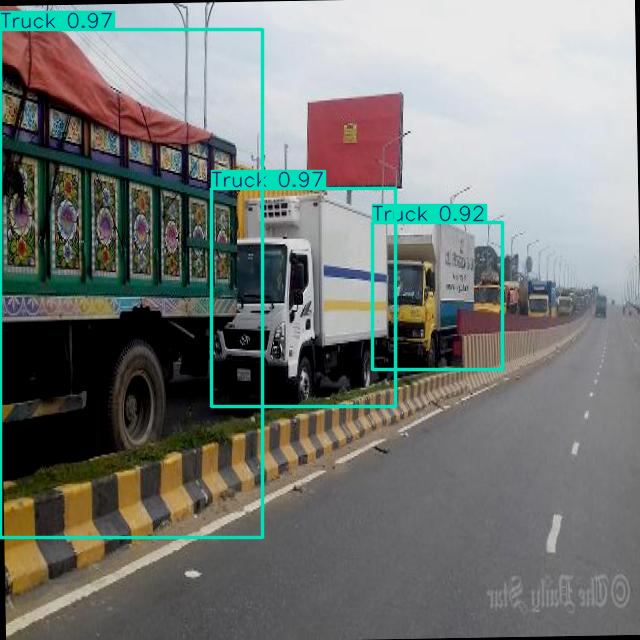

In [ ]:
results[0].show()

In [ ]:
results[0].save(filename="/content/output.jpg")

'/content/output.jpg'

In [ ]:
model(
    "/content/vehicle_detection_dataset/train/images",
    conf=0.3,
    save=True
)


image 1/240 /content/vehicle_detection_dataset/train/images/100_jpg.rf.5f15b0b5389a0e75ae4339cdc591d0f5.jpg: 640x640 3 Trucks, 7.4ms
image 2/240 /content/vehicle_detection_dataset/train/images/100_jpg.rf.7ec0445ceacbee35239c974dd882d488.jpg: 640x640 3 Trucks, 7.3ms
image 3/240 /content/vehicle_detection_dataset/train/images/100_jpg.rf.bcbfce1efb1640c88ea8e10ec6a98299.jpg: 640x640 3 Trucks, 7.3ms
image 4/240 /content/vehicle_detection_dataset/train/images/101_jpg.rf.2514d949dcbc60dbc5e750e524fbb97d.jpg: 640x640 4 Auto-Rickshaws, 1 Car, 1 Two-Wheeler, 7.3ms
image 5/240 /content/vehicle_detection_dataset/train/images/101_jpg.rf.7380332b02b240f37052e1deb43d96a4.jpg: 640x640 4 Auto-Rickshaws, 1 Car, 1 Two-Wheeler, 7.3ms
image 6/240 /content/vehicle_detection_dataset/train/images/101_jpg.rf.ca77d6882a7eb9b9e18f58053621089d.jpg: 640x640 3 Auto-Rickshaws, 1 Car, 1 Two-Wheeler, 7.3ms
image 7/240 /content/vehicle_detection_dataset/train/images/102_jpg.rf.094d0dceab34dd8683062641a1609338.jpg: 64

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Auto-Rickshaw', 1: 'Bus', 2: 'Car', 3: 'Truck', 4: 'Two-Wheeler', 5: 'Vehicles'}
 obb: None
 orig_img: array([[[0, 2, 2],
         [0, 2, 2],
         [0, 0, 4],
         ...,
         [1, 1, 1],
         [0, 0, 0],
         [2, 2, 2]],
 
        [[0, 2, 0],
         [0, 2, 0],
         [0, 1, 0],
         ...,
         [1, 1, 1],
         [0, 0, 0],
         [2, 2, 2]],
 
        [[0, 8, 0],
         [0, 8, 0],
         [0, 8, 0],
         ...,
         [1, 1, 1],
         [0, 0, 0],
         [2, 2, 2]],
 
        ...,
 
        [[7, 0, 0],
         [7, 2, 0],
         [4, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[7, 0, 0],
         [7, 2, 0],
         [4, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[7, 0, 0],
         [7, 2, 0],
     

Contents of /content/vehicle_detection_dataset:
['train', 'valid', 'data.yaml', 'README.roboflow.txt']
Contents of /content/vehicle_detection_dataset/test:
Error: Test directory not found at /content/vehicle_detection_dataset/test

image 1/1 /content/vehicle_detection_dataset/valid/images/174_jpg.rf.bf857b6be2db46397cf73631f295c4a1.jpg: 640x640 1 Auto-Rickshaw, 1 Car, 1 Truck, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


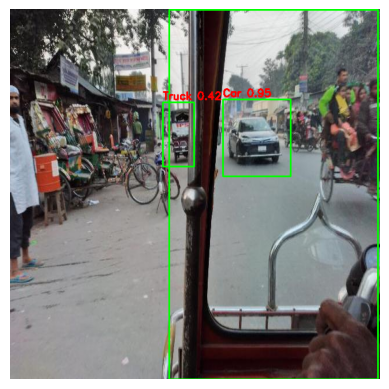

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Base path to the extracted dataset
base_dataset_path = "/content/vehicle_detection_dataset"

# --- Diagnostic Code Start ---
print(f"Contents of {base_dataset_path}:")
if os.path.exists(base_dataset_path):
    print(os.listdir(base_dataset_path))
    test_path = os.path.join(base_dataset_path, "test") # This path doesn't exist as seen in output
    print(f"Contents of {test_path}:")
    if os.path.exists(test_path):
        print(os.listdir(test_path))
    else:
        print(f"Error: Test directory not found at {test_path}")
else:
    print(f"Error: Base dataset directory not found at {base_dataset_path}")
# --- Diagnostic Code End ---

# Corrected path to the validation images directory, since 'test' does not exist
image_dir = os.path.join(base_dataset_path, "valid", "images") # Using 'valid' set

# Get the first image file in the directory
if not os.path.exists(image_dir):
    print(f"Error: {image_dir} does not exist. Please check the directory structure.")
    raise FileNotFoundError(f"No such directory: {image_dir}")

img_files = os.listdir(image_dir)

if not img_files:
    print("Error: No image files found in the directory.")
else:
    img_name = img_files[0] # Take the first image
    img_path = os.path.join(image_dir, img_name)

    img = cv2.imread(img_path)

    # Check if image was loaded successfully before processing
    if img is None:
        print(f"Error: Failed to load image from {img_path}. Please check the path and file integrity.")
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        results = model(img_path, conf=0.25)
        class_names = model.names

        for r in results:
            for box in r.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                cls = int(box.cls[0])
                conf = float(box.conf[0])

                label = f"{class_names[cls]} {conf:.2f}"

                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(
                    img,
                    label,
                    (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255, 0, 0),
                    2
                )

        plt.imshow(img)
        plt.axis("off")

In [ ]:
import os

image_dir = "/content/vehicle_detection_dataset/train/images"

for img_name in os.listdir(image_dir):
    img_path = os.path.join(image_dir, img_name)
    results = model(img_path, conf=0.3)
    results[0].show()